# ASHFORD and NEWBURY CRIME GEO MAP - 2020

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
# before basemap it may need: conda install -c conda-forge basemap-data-hires=1.0.8.dev0
from mpl_toolkits.basemap import Basemap
import numpy as np
import shapefile as shp #pyshp library
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
# conda install folium -c conda-forge
import folium

# ASHFORD: FIRST EXPERIMENT

In [10]:
# https://data.police.uk/data/
crime_pth1 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-metropolitan-street.csv'
crime_pth2 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-metropolitan-street.csv'
crime_pth3 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-metropolitan-street.csv'
crime_pth4 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-metropolitan-street.csv'
# background map from: https://www.openstreetmap.org/export#map=8/51.780/-0.978
ashford_pth= 'C:\\Datasets\\Crime_UK_2020\\ashford.png'

In [4]:
crime1 = pd.read_csv(crime_pth1)
print(crime1.shape)
crime1 = crime1[crime1.Location != 'No Location']
print(crime1.shape)
crime1 = crime1[(crime1.Longitude>=-0.5416) & (crime1.Longitude<=-0.4111) & (crime1.Latitude>=51.4060) &
               (crime1.Latitude<=51.4700)]
print(crime1.shape)
MapBox = ((crime1.Longitude.min(),crime1.Longitude.max(),      
         crime1.Latitude.min(), crime1.Latitude.max()))
MapBox2 = (-0.5416, -0.4111, 51.4060, 51.4700)
print(MapBox, MapBox2)

(90979, 12)
(90435, 12)
(436, 12)
(-0.5145029999999999, -0.41110699999999994, 51.428956, 51.469778000000005) (-0.5416, -0.4111, 51.406, 51.47)


In [11]:
crime2 = pd.read_csv(crime_pth2)
print(crime2.shape)
crime2 = crime2[crime2.Location != 'No Location']
print(crime2.shape)
crime2 = crime2[(crime2.Longitude>=-0.5416) & (crime2.Longitude<=-0.4111) & (crime2.Latitude>=51.4060) &
               (crime2.Latitude<=51.4700)]
print(crime2.shape)

(86984, 12)
(86413, 12)
(353, 12)


In [12]:
crime3 = pd.read_csv(crime_pth3)
print(crime3.shape)
crime3 = crime3[crime3.Location != 'No Location']
print(crime3.shape)
crime3 = crime3[(crime3.Longitude>=-0.5416) & (crime3.Longitude<=-0.4111) & (crime3.Latitude>=51.4060) &
               (crime3.Latitude<=51.4700)]
print(crime3.shape)

(87409, 12)
(86658, 12)
(418, 12)


In [13]:
crime4 = pd.read_csv(crime_pth4)
print(crime4.shape)
crime4 = crime4[crime4.Location != 'No Location']
print(crime4.shape)
crime4 = crime4[(crime4.Longitude>=-0.5416) & (crime4.Longitude<=-0.4111) & (crime4.Latitude>=51.4060) &
               (crime4.Latitude<=51.4700)]
print(crime4.shape)

(109951, 12)
(109697, 12)
(626, 12)


In [5]:
ashford_map = plt.imread(ashford_pth)

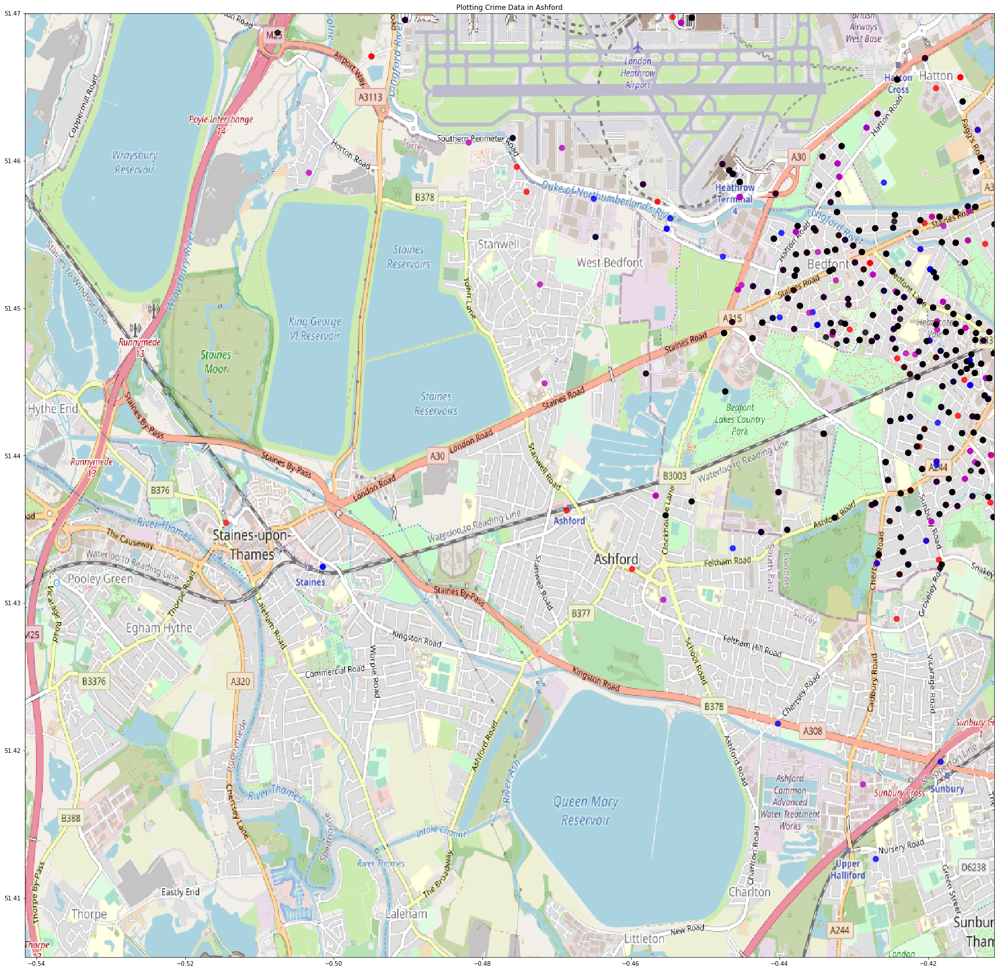

In [15]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(crime1.Longitude, crime1.Latitude, zorder=1, alpha= 0.8, c='r', s=90)
ax.scatter(crime2.Longitude, crime2.Latitude, zorder=2, alpha= 0.8, c='b', s=90)
ax.scatter(crime3.Longitude, crime3.Latitude, zorder=3, alpha= 0.8, c='m', s=90)
ax.scatter(crime4.Longitude, crime4.Latitude, zorder=4, alpha= 0.8, c='k', s=90)
ax.set_title('Plotting Crime Data in Ashford')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

In [17]:
# merge the 4 months
crime1_4 = pd.concat([crime1,crime2,crime3,crime4])
crime1_4.shape

(1833, 12)

In [50]:
print(crime1_4.groupby('Crime type').count()[['Month']])
loc_freq = crime1_4.groupby(['Longitude','Latitude']).count()[['Month']]
print(loc_freq.max())
mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
print(f'Most frequent crime scene:',mflong,mflat)

                              Month
Crime type                         
Anti-social behaviour           549
Bicycle theft                     9
Burglary                         51
Criminal damage and arson        88
Drugs                            78
Other crime                      91
Other theft                     198
Possession of weapons            12
Public order                     69
Robbery                          13
Shoplifting                      70
Theft from the person            16
Vehicle crime                   208
Violence and sexual offences    381
Month    189
dtype: int64
Most frequent crime scene: -0.451842 51.469708000000004


In [49]:
loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]

51.469708000000004

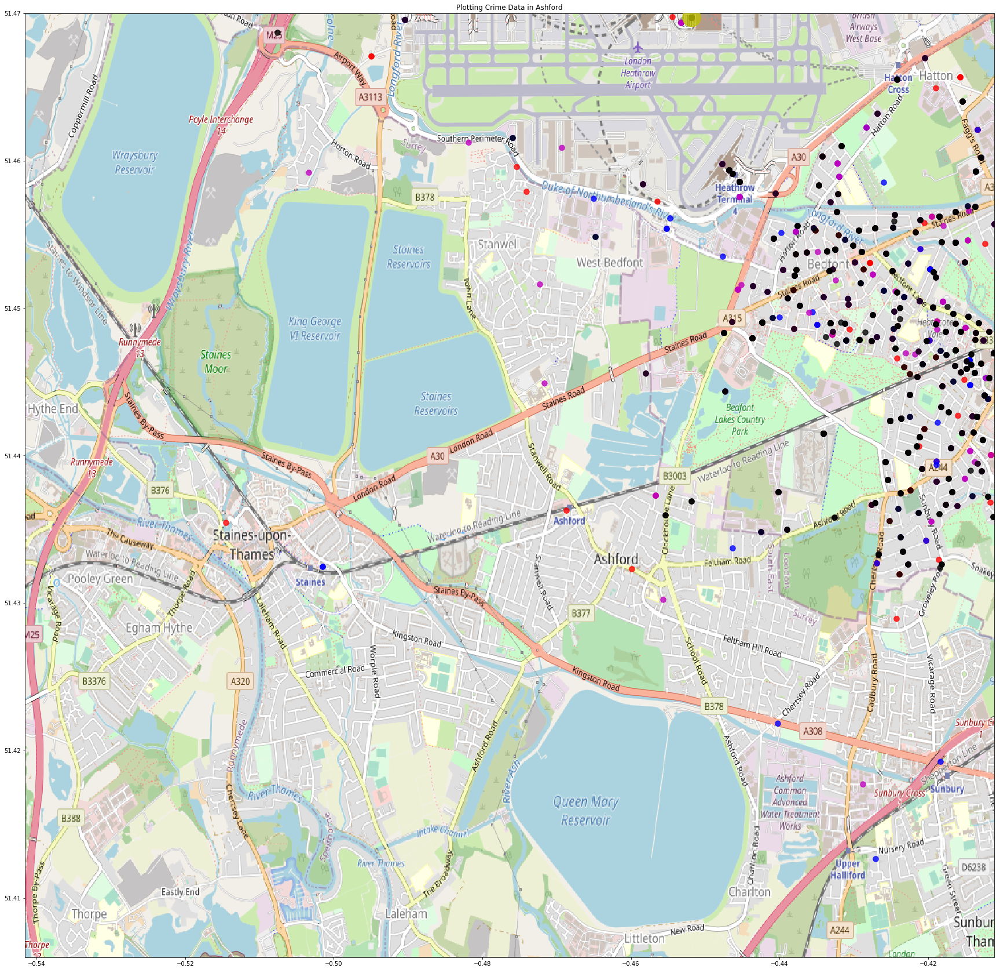

In [55]:
# POINT OF THE MOST BUSY PLACE - YELLOW

fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(crime1.Longitude, crime1.Latitude, zorder=1, alpha= 0.8, c='r', s=90)
ax.scatter(crime2.Longitude, crime2.Latitude, zorder=2, alpha= 0.8, c='b', s=90)
ax.scatter(crime3.Longitude, crime3.Latitude, zorder=3, alpha= 0.8, c='m', s=90)
ax.scatter(crime4.Longitude, crime4.Latitude, zorder=4, alpha= 0.8, c='k', s=90)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Ashford')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

In [62]:
loc_freq = crime1_4.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()

loc_freq.head()

,Longitude,Latitude,Month
0,-0.514503,51.435484,1
1,-0.507622,51.468713,1
2,-0.503413,51.459191,1
3,-0.501494,51.432495,2
4,-0.494977,51.467095,2


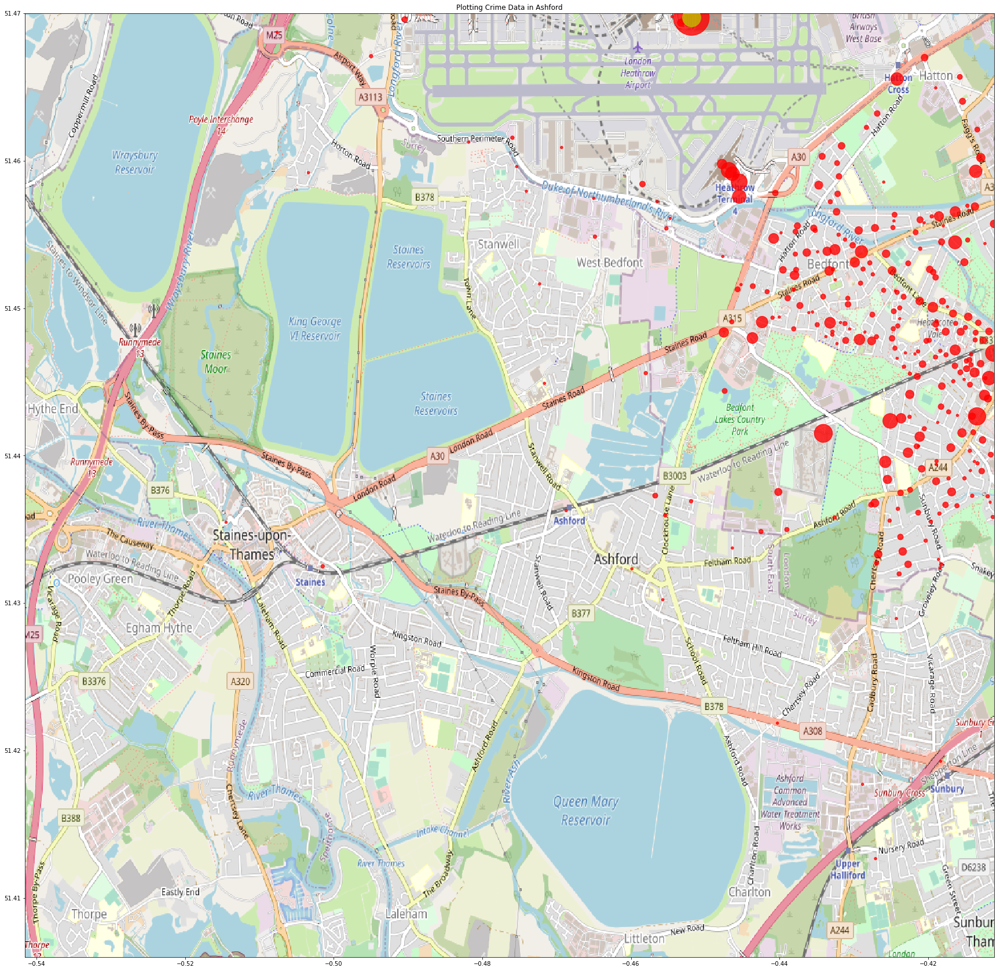

In [61]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Ashford')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

# ASHFORD: SECOND EXPERIMENT

# Where are the rest of the crimes?
### 1. transport police: e.g. 2020-01-btp-street.csv
### 2. surrey: e.g 2020-01-surrey-street.csv
### 3. thames valley: e.g 2020-01-thames-valley-street.csv

In [63]:
# https://data.police.uk/data/
crime_pth1_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-btp-street.csv'
crime_pth2_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-btp-street.csv'
crime_pth3_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-btp-street.csv'
crime_pth4_2 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-btp-street.csv'

crime_pth1_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-surrey-street.csv'
crime_pth2_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-surrey-street.csv'
crime_pth3_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-surrey-street.csv'
crime_pth4_3 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-surrey-street.csv'

crime_pth1_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-thames-valley-street.csv'
crime_pth2_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-thames-valley-street.csv'
crime_pth3_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-thames-valley-street.csv'
crime_pth4_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-thames-valley-street.csv'

In [74]:
paths = [crime_pth1,crime_pth2,crime_pth3,crime_pth4,
         crime_pth1_2,crime_pth2_2,crime_pth3_2,crime_pth4_2,
         crime_pth1_3,crime_pth2_3,crime_pth3_3,crime_pth4_3,
         crime_pth1_4,crime_pth2_4,crime_pth3_4,crime_pth4_4]

crime_all=pd.DataFrame(columns=['Crime ID','Month','Reported by','Falls within','Longitude',
                               'Latitude','Location','LSOA code','LSOA name','Crime type',
                               'Last outcome category','Context'])
for i in range(len(paths)):
    print(i,paths[i] )
    crime_all=crime_all.append(pd.read_csv(paths[i]))


#crime_all = pd.concat([crime1,crime2,crime3,crime4])

0 C:\Datasets\Crime_UK_2020\2020-01-metropolitan-street.csv
1 C:\Datasets\Crime_UK_2020\2020-02-metropolitan-street.csv
2 C:\Datasets\Crime_UK_2020\2020-03-metropolitan-street.csv
3 C:\Datasets\Crime_UK_2020\2020-04-metropolitan-street.csv
4 C:\Datasets\Crime_UK_2020\2020-01-btp-street.csv
5 C:\Datasets\Crime_UK_2020\2020-02-btp-street.csv
6 C:\Datasets\Crime_UK_2020\2020-03-btp-street.csv
7 C:\Datasets\Crime_UK_2020\2020-04-btp-street.csv
8 C:\Datasets\Crime_UK_2020\2020-01-surrey-street.csv
9 C:\Datasets\Crime_UK_2020\2020-02-surrey-street.csv
10 C:\Datasets\Crime_UK_2020\2020-03-surrey-street.csv
11 C:\Datasets\Crime_UK_2020\2020-04-surrey-street.csv
12 C:\Datasets\Crime_UK_2020\2020-01-thames-valley-street.csv
13 C:\Datasets\Crime_UK_2020\2020-02-thames-valley-street.csv
14 C:\Datasets\Crime_UK_2020\2020-03-thames-valley-street.csv
15 C:\Datasets\Crime_UK_2020\2020-04-thames-valley-street.csv


In [76]:
crime_all.shape

(486003, 12)

In [77]:
crime_all = crime_all[crime_all.Location != 'No Location']
print(crime_all.shape)
crime_all = crime_all[(crime_all.Longitude>=-0.5416) & (crime_all.Longitude<=-0.4111) & (crime_all.Latitude>=51.4060) &
               (crime_all.Latitude<=51.4700)]
print(crime_all.shape)
MapBox = ((crime_all.Longitude.min(),crime_all.Longitude.max(),      
         crime_all.Latitude.min(), crime_all.Latitude.max()))
MapBox2 = (-0.5416, -0.4111, 51.4060, 51.4700)
print(MapBox, MapBox2)

(475737, 12)
(5253, 12)
(-0.541568, -0.41110699999999994, 51.406003999999996, 51.469986999999996) (-0.5416, -0.4111, 51.406, 51.47)


In [78]:
print(crime_all.groupby('Crime type').count()[['Month']])
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']]
print(loc_freq.max())
mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
print(f'Most frequent crime scene:',mflong,mflat)

                              Month
Crime type                         
Anti-social behaviour          1471
Bicycle theft                    41
Burglary                        240
Criminal damage and arson       398
Drugs                           205
Other crime                     154
Other theft                     372
Possession of weapons            38
Public order                    344
Robbery                          28
Shoplifting                     165
Theft from the person            41
Vehicle crime                   500
Violence and sexual offences   1256
Month    189
dtype: int64
Most frequent crime scene: -0.451842 51.469708000000004


In [81]:
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()

loc_freq.head()

,Longitude,Latitude,Month
0,-0.541568,51.434466,1
1,-0.541514,51.443845,1
2,-0.541433,51.440085,1
3,-0.540932,51.432768,8
4,-0.540516,51.407000,2


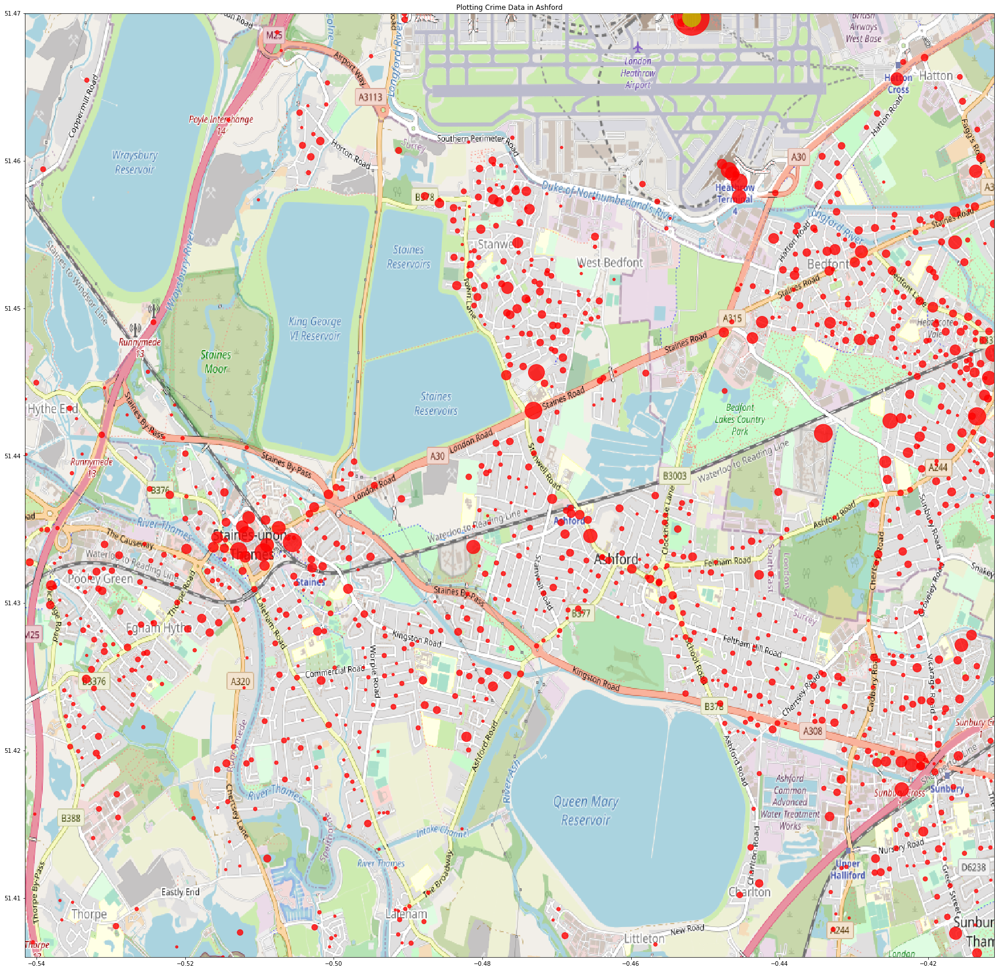

In [82]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Ashford')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(ashford_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()

# NEWBURY: FIRST EXPERIMENT

In [87]:
# https://data.police.uk/data/
crime_pth1_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-01-thames-valley-street.csv'
crime_pth2_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-02-thames-valley-street.csv'
crime_pth3_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-03-thames-valley-street.csv'
crime_pth4_4 = 'C:\\Datasets\\Crime_UK_2020\\2020-04-thames-valley-street.csv'
# background map from: https://www.openstreetmap.org/export#map=8/51.780/-0.978
newbury_pth= 'C:\\Datasets\\Crime_UK_2020\\newbury.png'

In [91]:
paths = [crime_pth1_4,crime_pth2_4,crime_pth3_4,crime_pth4_4]

crime_all=pd.DataFrame(columns=['Crime ID','Month','Reported by','Falls within','Longitude',
                               'Latitude','Location','LSOA code','LSOA name','Crime type',
                               'Last outcome category','Context'])
for i in range(len(paths)):
    print(i,paths[i] )
    crime_all=crime_all.append(pd.read_csv(paths[i]))


#crime_all = pd.concat([crime1,crime2,crime3,crime4])

0 C:\Datasets\Crime_UK_2020\2020-01-thames-valley-street.csv
1 C:\Datasets\Crime_UK_2020\2020-02-thames-valley-street.csv
2 C:\Datasets\Crime_UK_2020\2020-03-thames-valley-street.csv
3 C:\Datasets\Crime_UK_2020\2020-04-thames-valley-street.csv


In [92]:
crime_all.shape

(62170, 12)

In [88]:
newbury_map = plt.imread(newbury_pth)

In [93]:
crime_all = crime_all[crime_all.Location != 'No Location']
print(crime_all.shape)
crime_all = crime_all[(crime_all.Longitude>=-1.4131) & (crime_all.Longitude<=-1.1522) & (crime_all.Latitude>=51.3233) &
               (crime_all.Latitude<=51.4517)]
print(crime_all.shape)
MapBox = ((crime_all.Longitude.min(),crime_all.Longitude.max(),      
         crime_all.Latitude.min(), crime_all.Latitude.max()))
MapBox2 = (-1.4131, -1.1522, 51.3233, 51.4517)
print(MapBox, MapBox2)


(54623, 12)
(1749, 12)
(-1.4027209999999999, -1.1526610000000002, 51.361376, 51.450751000000004) (-1.4131, -1.1522, 51.3233, 51.4517)


In [94]:
print(crime_all.groupby('Crime type').count()[['Month']])
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']]
print(loc_freq.max())
mflong = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,0]
mflat = loc_freq[loc_freq.Month==loc_freq.max()[0]].reset_index().iloc[0,1]
print(f'Most frequent crime scene:',mflong,mflat)

                              Month
Crime type                         
Anti-social behaviour           269
Bicycle theft                    20
Burglary                         88
Criminal damage and arson       205
Drugs                            81
Other crime                      28
Other theft                     130
Possession of weapons            12
Public order                     56
Robbery                          11
Shoplifting                     129
Theft from the person            18
Vehicle crime                   133
Violence and sexual offences    569
Month    60
dtype: int64
Most frequent crime scene: -1.248739 51.384985


In [95]:
loc_freq = crime_all.groupby(['Longitude','Latitude']).count()[['Month']].reset_index()

loc_freq.head()

,Longitude,Latitude,Month
0,-1.402721,51.446430,1
1,-1.400298,51.390768,2
2,-1.392130,51.443247,4
3,-1.384853,51.376526,1
4,-1.377250,51.380928,3


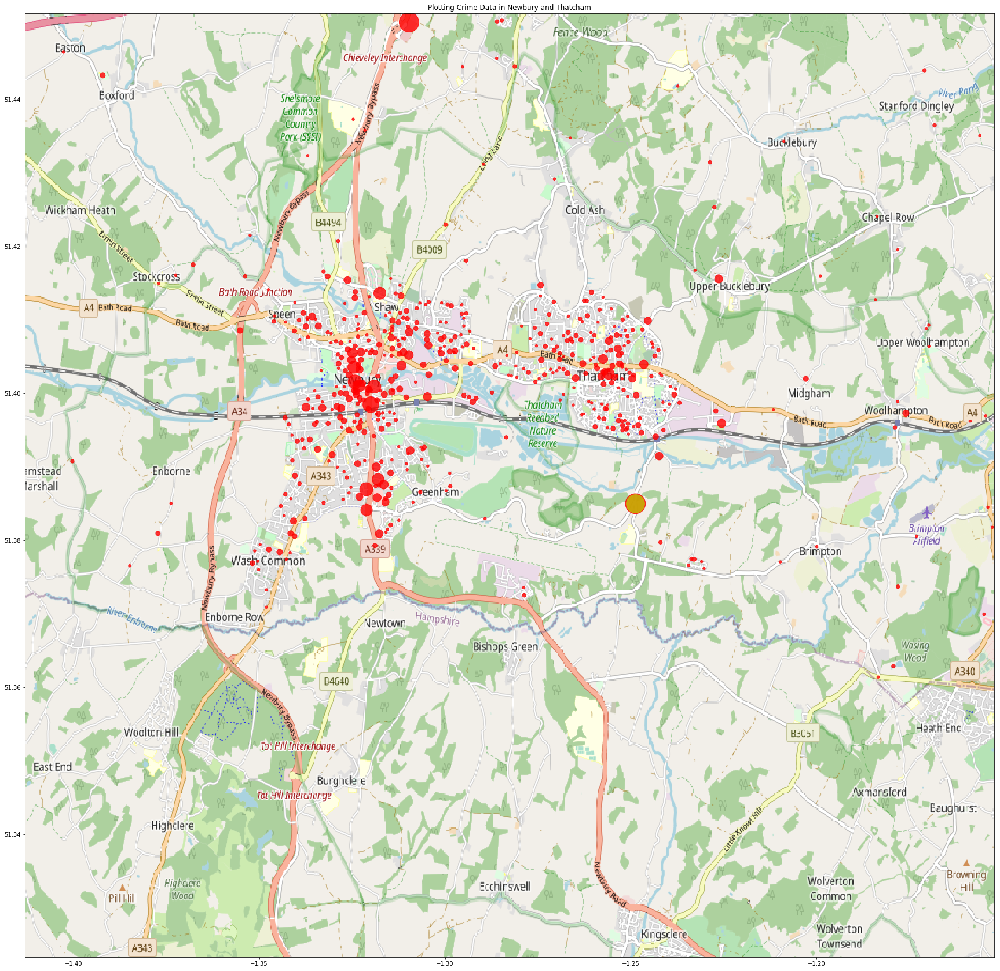

In [96]:
fig, ax = plt.subplots(figsize = (30,30))
ax.scatter(loc_freq.Longitude, loc_freq.Latitude, zorder=1, alpha= 0.8, c='r', s=loc_freq.Month*20)

ax.scatter(mflong, mflat, alpha= 0.8, zorder=5, c='y', s=1000)

ax.set_title('Plotting Crime Data in Newbury and Thatcham')
ax.set_xlim(MapBox2[0],MapBox2[1])# not necessary at the moment
ax.set_ylim(MapBox2[2],MapBox2[3])# not necessary at the moment
ax.imshow(newbury_map, zorder=0, extent = MapBox2, aspect= 'auto')

plt.show()